# DCGAN

In [1]:
from __future__ import print_function
#%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
# Root directory for dataset
dataroot = "data/celeba"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

The code follows along mostly with the very informative Deep Convolutional Generative Adversarial Networks tutorial by pytorch, as can be found at https://pytorch.org/tutorials/beginner/dcgan_faces_tutorial.html

## Data

In [3]:
# Create dataset by using ImageFolder class
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))

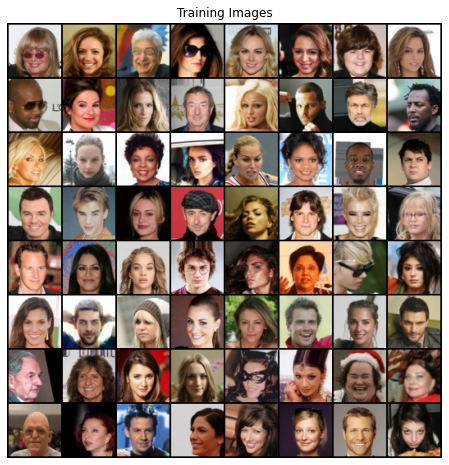

In [4]:
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))


In [5]:
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")
print(device)

cuda:0


In [6]:
# Custom weight initialization - Normal dist, \mu = 0, std = 0.02
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

## Generator

In [7]:
# Constructing a Generator module

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.gen = nn.Sequential(
            
            # input is Z, going into a convolution
            # Params are: in_channels, out_channels, kernel_size, stride, padding
            nn.ConvTranspose2d(nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            nn.ReLU()
            
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, x):
        return self.gen(x)

In [8]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netG.apply(weights_init)

# Print the model
print(netG)

Generator(
  (gen): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


## Discriminator

The DCGAN paper mentions it is a good practice to use strided convolution rather than pooling to downsample because it lets the network learn its own pooling function

In [9]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
#  to mean=0, stdev=0.2.
netD.apply(weights_init)

# Print the model
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


## Loss and Optimization

In [11]:
# Initialize BCELoss function
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Establish convention for real and fake labels during training
real_label = 1.
fake_label = 0.

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

## Actual Training

Construct different mini-batches for real and fake images to enhance training.

In [28]:
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Start training")

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):
        
        ###################
        ## Discriminator ##
        ###################
        # First train with all real samples
        netD.zero_grad()
        
        # Augment batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        label = torch.full((b_size,), real_label, dtype=torch.float, device=device)
        
        # Forward through D and calculate loss
        output = netD(real_cpu).view(-1)
        errD_real = criterion(output, label)
        
        # Gradients for D
        errD_real.backward()
        D_x = output.mean().item()
        
        # Train discriminator on all fakes
        # Generate latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device) # batch x latent_dim x 1 x 1
        
        # Apply generator
        fake = netG(noise)
        label.fill_(fake_label)
        
        # Classify fakes and calc loss
        output = netD(fake.detach()).view(-1) # We detach the fake gradients here
        errD_fake = criterion(output, label)
        
        # Gradients
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        
        # Sum gradients and step
        errD = errD_real + errD_fake
        optimizerD.step()
        
        ###################
        #### Generator ####
        ###################
        netG.zero_grad()
        label.fill_(real_label) # Fake labels are "real" for generator cost func
        
        # We just updated D, so perform second forward pass of all-fake through D
        output = netD(fake).view(-1)
        errG = criterion(output, label)
        
        # Backward the grad
        errG.backward()
        D_G_z2 = output.mean().item()
        
        # Step
        optimizerG.step()
        

        # Print stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))

        iters += 1

Start training
[0/5][0/1583]	Loss_D: 0.4066	Loss_G: 20.4808	D(x): 0.8445	D(G(z)): 0.0000 / 0.0000
[0/5][50/1583]	Loss_D: 1.5372	Loss_G: 25.6458	D(x): 0.9576	D(G(z)): 0.6835 / 0.0000
[0/5][100/1583]	Loss_D: 0.3662	Loss_G: 6.0535	D(x): 0.8536	D(G(z)): 0.1030 / 0.0048
[0/5][150/1583]	Loss_D: 0.8162	Loss_G: 4.2035	D(x): 0.5966	D(G(z)): 0.0154 / 0.0334
[0/5][200/1583]	Loss_D: 0.4258	Loss_G: 5.1964	D(x): 0.9314	D(G(z)): 0.2308 / 0.0138
[0/5][250/1583]	Loss_D: 0.2375	Loss_G: 4.7705	D(x): 0.8857	D(G(z)): 0.0865 / 0.0139
[0/5][300/1583]	Loss_D: 0.4778	Loss_G: 3.3519	D(x): 0.7392	D(G(z)): 0.0704 / 0.0784
[0/5][350/1583]	Loss_D: 0.5916	Loss_G: 3.0404	D(x): 0.7301	D(G(z)): 0.1542 / 0.0719
[0/5][400/1583]	Loss_D: 0.4834	Loss_G: 3.4544	D(x): 0.7588	D(G(z)): 0.1191 / 0.0527
[0/5][450/1583]	Loss_D: 0.2818	Loss_G: 3.7087	D(x): 0.8483	D(G(z)): 0.0735 / 0.0543
[0/5][500/1583]	Loss_D: 0.8083	Loss_G: 2.6844	D(x): 0.6670	D(G(z)): 0.1872 / 0.0983
[0/5][550/1583]	Loss_D: 0.9070	Loss_G: 8.5203	D(x): 0.8623	D(G

[3/5][100/1583]	Loss_D: 1.3729	Loss_G: 4.9481	D(x): 0.9448	D(G(z)): 0.6673 / 0.0109
[3/5][150/1583]	Loss_D: 1.0146	Loss_G: 4.4886	D(x): 0.9192	D(G(z)): 0.5598 / 0.0192
[3/5][200/1583]	Loss_D: 0.4328	Loss_G: 2.9670	D(x): 0.8429	D(G(z)): 0.2048 / 0.0688
[3/5][250/1583]	Loss_D: 1.0035	Loss_G: 1.6715	D(x): 0.5009	D(G(z)): 0.1123 / 0.2451
[3/5][300/1583]	Loss_D: 0.6763	Loss_G: 2.0536	D(x): 0.6591	D(G(z)): 0.1634 / 0.1584
[3/5][350/1583]	Loss_D: 0.8818	Loss_G: 0.8504	D(x): 0.4952	D(G(z)): 0.0744 / 0.4750
[3/5][400/1583]	Loss_D: 0.6491	Loss_G: 2.1141	D(x): 0.7765	D(G(z)): 0.2852 / 0.1549
[3/5][450/1583]	Loss_D: 0.8541	Loss_G: 2.9788	D(x): 0.8736	D(G(z)): 0.4644 / 0.0701
[3/5][500/1583]	Loss_D: 0.7644	Loss_G: 2.2037	D(x): 0.7180	D(G(z)): 0.2996 / 0.1384
[3/5][550/1583]	Loss_D: 0.5942	Loss_G: 1.7699	D(x): 0.7019	D(G(z)): 0.1788 / 0.2029
[3/5][600/1583]	Loss_D: 0.6424	Loss_G: 1.7632	D(x): 0.7347	D(G(z)): 0.2343 / 0.2080
[3/5][650/1583]	Loss_D: 0.7657	Loss_G: 2.7974	D(x): 0.8042	D(G(z)): 0.3808 /

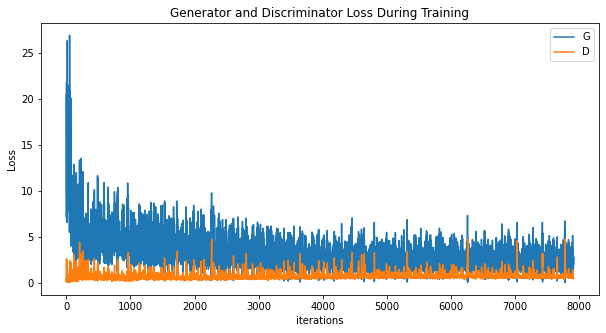

In [29]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

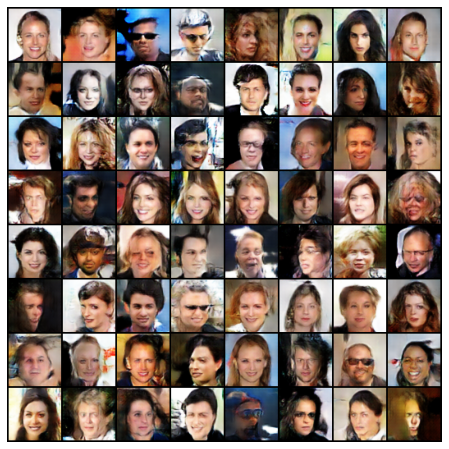

In [30]:
#%%capture
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())